In [58]:
#import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.impute import KNNImputer
from scipy import stats
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
from sklearn.decomposition import PCA
import hiplot as hip
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from imblearn.over_sampling import SMOTE
import json

In [59]:
#import data
data = pd.read_csv(r"C:\Users\manos\OneDrive\Desktop\MSU\Fall 2024\CMSE 830 Foundations of Data Science\Project\Midterm\UCI_Credit_Card.csv")
data_macro = pd.read_excel(r"C:\Users\manos\OneDrive\Desktop\MSU\Fall 2024\CMSE 830 Foundations of Data Science\Project\Midterm\Macroeconomic indicators.xlsx")
data_income = pd.read_excel(r"C:\Users\manos\OneDrive\Desktop\MSU\Fall 2024\CMSE 830 Foundations of Data Science\Project\Midterm\Income level.xlsx")
print(data.head())
print(data.shape)
print(data_macro)
print(data_macro.shape)
print(data_income)
print(data_income.shape)

   ID  LIMIT_BAL     SEX   EDUCATION MARRIAGE  AGE  PAY_0  PAY_2  PAY_3  \
0   1      20000  female  university  married   24      2      2     -1   
1   2     120000  female  university   single   26     -1      2      0   
2   3      90000  female  university   single   34      0      0      0   
3   4      50000  female  university  married   37      0      0      0   
4   5      50000    male  university  married   57     -1      0     -1   

   PAY_4  ...  BILL_AMT4  BILL_AMT5  BILL_AMT6  PAY_AMT1  PAY_AMT2  PAY_AMT3  \
0     -1  ...          0          0          0         0       689         0   
1      0  ...       3272       3455       3261         0      1000      1000   
2      0  ...      14331      14948      15549      1518      1500      1000   
3      0  ...      28314      28959      29547      2000      2019      1200   
4      0  ...      20940      19146      19131      2000     36681     10000   

   PAY_AMT4  PAY_AMT5  PAY_AMT6  default.payment.next.month  
0     

#### Data Cleaning and Preparation

In [60]:
### Variable identification and classification

#ID is a unique variable so drop it
data =  data.drop(columns = ['ID'])

#rename columns
data.rename(columns={'default.payment.next.month': 'Default'}, inplace=True)
data.rename(columns={'PAY_0': 'PAY_1'}, inplace=True)

Target (dependent) variable: Default

Explanatory (independent) variable: All other variables for now. Relationships will be further explored during EDA.

In [61]:
#classify variables in credit data
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 24 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   LIMIT_BAL  30000 non-null  int64 
 1   SEX        30000 non-null  object
 2   EDUCATION  29655 non-null  object
 3   MARRIAGE   29946 non-null  object
 4   AGE        30000 non-null  int64 
 5   PAY_1      30000 non-null  int64 
 6   PAY_2      30000 non-null  int64 
 7   PAY_3      30000 non-null  int64 
 8   PAY_4      30000 non-null  int64 
 9   PAY_5      30000 non-null  int64 
 10  PAY_6      30000 non-null  int64 
 11  BILL_AMT1  30000 non-null  int64 
 12  BILL_AMT2  30000 non-null  int64 
 13  BILL_AMT3  30000 non-null  int64 
 14  BILL_AMT4  30000 non-null  int64 
 15  BILL_AMT5  30000 non-null  int64 
 16  BILL_AMT6  30000 non-null  int64 
 17  PAY_AMT1   30000 non-null  int64 
 18  PAY_AMT2   30000 non-null  int64 
 19  PAY_AMT3   30000 non-null  int64 
 20  PAY_AMT4   30000 non-null  i

14 quantitative variables with discrete data (integers): LIMIT_BAL, AGE, BILL_AMT1-6, PAY_AMT1-6 

10 categorical variables: EDUCATION & MARRIAGE are nominal. SEX & Default are binary. PAY_1-6 are ordinal.

In [62]:
#classify variables in macro data
data_macro.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12 entries, 0 to 11
Data columns (total 3 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Month              12 non-null     object 
 1   CPI                12 non-null     float64
 2   Unemployment Rate  12 non-null     float64
dtypes: float64(2), object(1)
memory usage: 420.0+ bytes


1 categorical variable: Month

2 quantitative variables with continuous data: CPI, Unemployment Rate

In [63]:
#classify variables in income data
data_income.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15 entries, 0 to 14
Data columns (total 2 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Demographic       15 non-null     object 
 1   Avg Income level  15 non-null     float64
dtypes: float64(1), object(1)
memory usage: 372.0+ bytes


1 categorical variable: Demographic

1 quantitative variable with continuous data: Avg Income level

In [64]:
### Data Quality Assessment

#check unique values of categorical variables for inconsistencies and compare with data description to verify data accuracy
data['SEX'].value_counts() #all labels match

SEX
female    18112
male      11888
Name: count, dtype: int64

In [65]:
data['EDUCATION'].value_counts() #all labels match

EDUCATION
university         14030
graduate school    10585
high school         4917
others               123
Name: count, dtype: int64

In [66]:
data['MARRIAGE'].value_counts() #all labels match

MARRIAGE
single     15964
married    13659
others       323
Name: count, dtype: int64

In [67]:
data['PAY_1'].value_counts() #labels don't match

PAY_1
 0    14737
-1     5686
 1     3688
-2     2759
 2     2667
 3      322
 4       76
 5       26
 8       19
 6       11
 7        9
Name: count, dtype: int64

-2 and 0 instances are undocumented but make up a significant chunk of the data so cannot be treated as unknowns

Upon inspection of the order and row data, we can infer -2=no payment due and 0=payment delay for <1 month (however we cannot be sure) 

In [68]:
data['Default'].value_counts() #all labels match

Default
no     23364
yes     6636
Name: count, dtype: int64

In [69]:
### Basic Descriptive Statistics

data.describe()

,LIMIT_BAL,AGE,PAY_1,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6
count,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,3.000000e+04,30000.000000,30000.000000,30000.000000,30000.000000,3.000000e+04,30000.00000,30000.000000,30000.000000,30000.000000
mean,167484.322667,35.485500,-0.016700,-0.133767,-0.166200,-0.220667,-0.266200,-0.291100,51223.330900,49179.075167,4.701315e+04,43262.948967,40311.400967,38871.760400,5663.580500,5.921163e+03,5225.68150,4826.076867,4799.387633,5215.502567
std,129747.661567,9.217904,1.123802,1.197186,1.196868,1.169139,1.133187,1.149988,73635.860576,71173.768783,6.934939e+04,64332.856134,60797.155770,59554.107537,16563.280354,2.304087e+04,17606.96147,15666.159744,15278.305679,17777.465775
min,10000.000000,21.000000,-2.000000,-2.000000,-2.000000,-2.000000,-2.000000,-2.000000,-165580.000000,-69777.000000,-1.572640e+05,-170000.000000,-81334.000000,-339603.000000,0.000000,0.000000e+00,0.00000,0.000000,0.000000,0.000000
25%,50000.000000,28.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,3558.750000,2984.750000,2.666250e+03,2326.750000,1763.000000,1256.000000,1000.000000,8.330000e+02,390.00000,296.000000,252.500000,117.750000
50%,140000.000000,34.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,22381.500000,21200.000000,2.008850e+04,19052.000000,18104.500000,17071.000000,2100.000000,2.009000e+03,1800.00000,1500.000000,1500.000000,1500.000000
75%,240000.000000,41.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,67091.000000,64006.250000,6.016475e+04,54506.000000,50190.500000,49198.250000,5006.000000,5.000000e+03,4505.00000,4013.250000,4031.500000,4000.000000
max,1000000.000000,79.000000,8.000000,8.000000,8.000000,8.000000,8.000000,8.000000,964511.000000,983931.000000,1.664089e+06,891586.000000,927171.000000,961664.000000,873552.000000,1.684259e+06,896040.00000,621000.000000,426529.000000,528666.000000


#### Data Cleaning and Preparation

In [70]:
### Data Cleaning and preprocessing

#check for duplicate values
data.duplicated().sum() #35
data.drop_duplicates(inplace=True)

In [71]:
##10 categorical variables: EDUCATION & MARRIAGE are nominal. SEX & Default are binary. PAY_1-6 are ordinal.
#Encode categorical variables for imputation
categorical = data[['MARRIAGE', 'SEX', 'Default','EDUCATION']]
le = LabelEncoder() #first convert columns to numerical labels
data['SEX_label'] = le.fit_transform(data['SEX'])
data['EDUCATION_label'] = le.fit_transform(data['EDUCATION'])
data['MARRIAGE_label'] = le.fit_transform(data['MARRIAGE'])
data['Default_label'] = le.fit_transform(data['Default'])

data['MARRIAGE_label'] = data['MARRIAGE_label'].replace({3: np.nan}) #introduce NaNs again
data['EDUCATION_label'] = data['EDUCATION_label'].replace({4: np.nan})

In [72]:
data.info() #recheck data types for consistecy

<class 'pandas.core.frame.DataFrame'>
Index: 29965 entries, 0 to 29999
Data columns (total 28 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   LIMIT_BAL        29965 non-null  int64  
 1   SEX              29965 non-null  object 
 2   EDUCATION        29620 non-null  object 
 3   MARRIAGE         29911 non-null  object 
 4   AGE              29965 non-null  int64  
 5   PAY_1            29965 non-null  int64  
 6   PAY_2            29965 non-null  int64  
 7   PAY_3            29965 non-null  int64  
 8   PAY_4            29965 non-null  int64  
 9   PAY_5            29965 non-null  int64  
 10  PAY_6            29965 non-null  int64  
 11  BILL_AMT1        29965 non-null  int64  
 12  BILL_AMT2        29965 non-null  int64  
 13  BILL_AMT3        29965 non-null  int64  
 14  BILL_AMT4        29965 non-null  int64  
 15  BILL_AMT5        29965 non-null  int64  
 16  BILL_AMT6        29965 non-null  int64  
 17  PAY_AMT1         

In [73]:
### Missing data analysis

total = data.isnull().sum().sort_values(ascending = False)
percent = (data.isnull().sum()/data.isnull().count()*100).sort_values(ascending = False)
pd.concat([total, percent], axis=1, keys=['Total', 'Percent']).transpose()

,EDUCATION,EDUCATION_label,MARRIAGE_label,MARRIAGE,AGE,PAY_1,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT4,BILL_AMT5,PAY_AMT3,PAY_AMT2,PAY_AMT4,PAY_AMT5,Default,PAY_AMT6,SEX_label,Default_label
Total,345.000000,345.000000,54.00000,54.00000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Percent,1.151343,1.151343,0.18021,0.18021,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


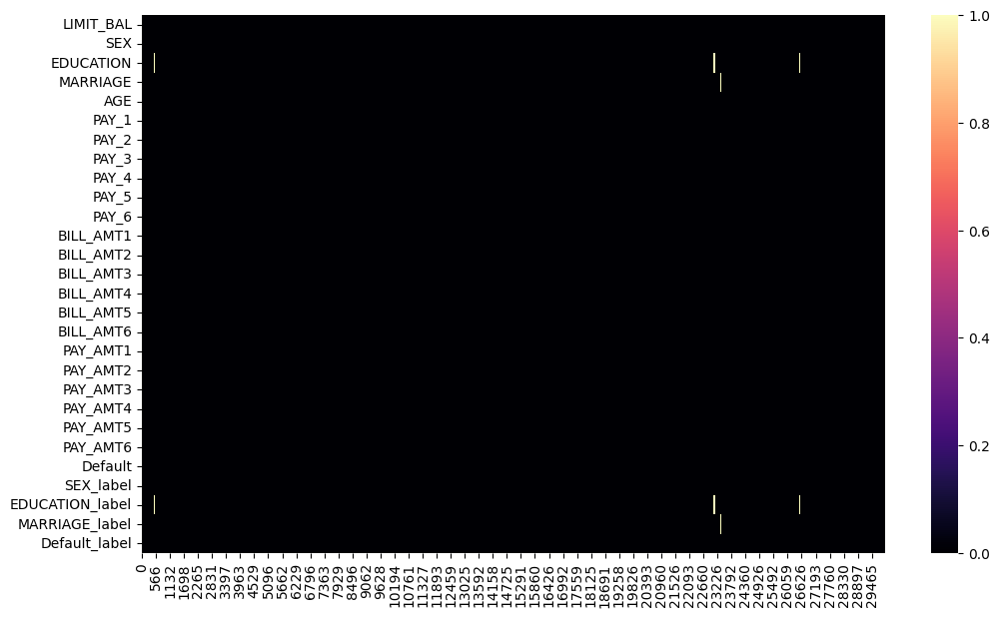

In [74]:
#visualize missing data
plt.figure(figsize=(12, 7))
sns.heatmap(data.isna().transpose(),cmap='magma')
plt.show()

#create correlation matrix for missing rows
data_dup = data.copy()
data_dup['EDUCATION_missing'] = data['EDUCATION'].isna().astype(int)
data_dup['MARRIAGE_missing'] = data['MARRIAGE'].isna().astype(int)
numeric_cols = data_dup.select_dtypes(include=[np.number])
corr_matrix = numeric_cols.corr()
corr = corr_matrix[['EDUCATION_missing', 'MARRIAGE_missing']]
fig = px.imshow(corr.T, 
                text_auto=True, 
                color_continuous_scale='RdBu_r', 
                aspect='auto',
                title="Correlation Heatmap for Missing Values")
fig.show()

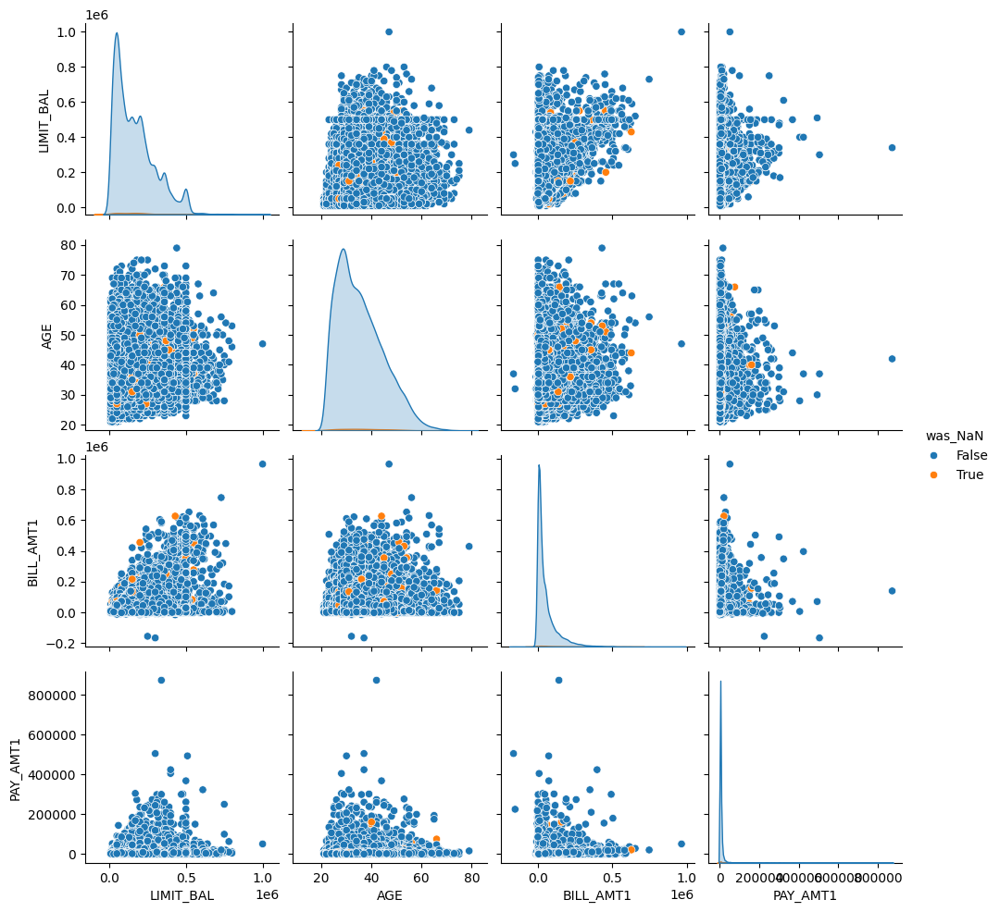

In [75]:
#use pairplot to get additional insights into missingness
data["was_NaN"] = False
data.loc[data["EDUCATION"].isnull() == True, "was_NaN"] = True
sns.pairplot(data, hue="was_NaN",vars=["LIMIT_BAL", "AGE","BILL_AMT1","PAY_AMT1"])

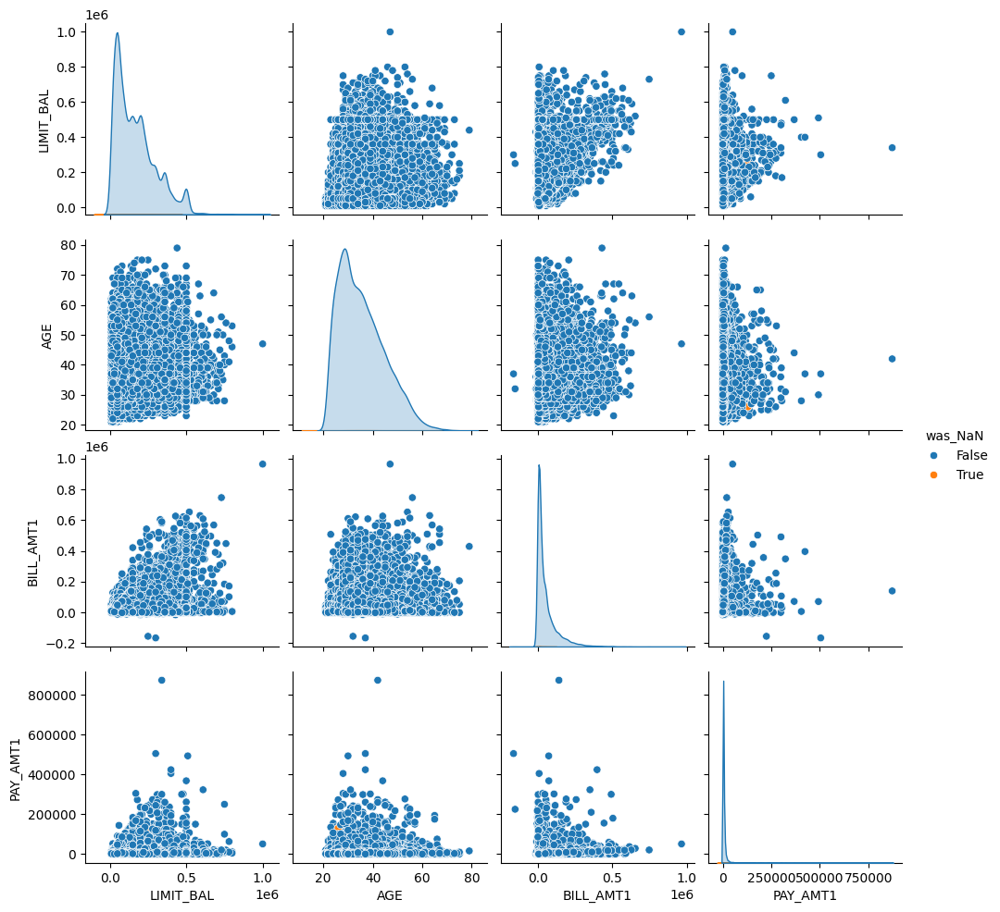

In [21]:
data["was_NaN"] = False
data.loc[data["MARRIAGE"].isnull() == True, "was_NaN"] = True
sns.pairplot(data, hue="was_NaN",vars=["LIMIT_BAL", "AGE","BILL_AMT1","PAY_AMT1"])

In [76]:
#remove new column added
data.drop('was_NaN', axis=1, inplace=True)

No significant correlation between the variables and missing data so MCAR missingness of general pattern (most complex to handle). 

Missing data is an insignificant percentage of the overall data & we can safely drop columns. Will also impute to not lose significant information.

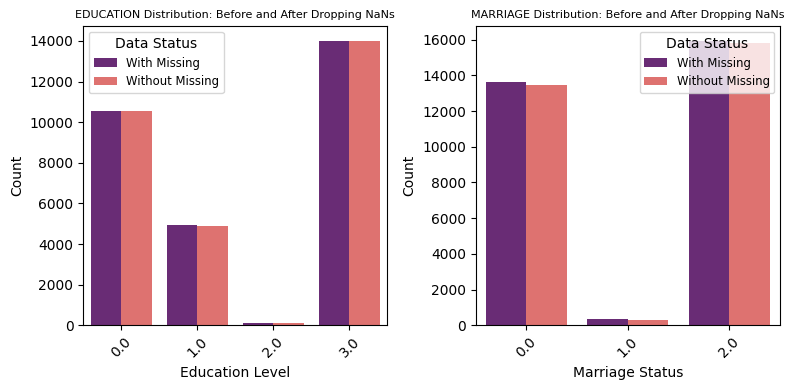

In [77]:
#drop missing rows
data_dropped = data.copy()
data_dropped.dropna(inplace=True)
data['NaN'] = 'With Missing'
data_dropped['NaN'] = 'Without Missing'
combined_data = pd.concat([data, data_dropped], ignore_index=True)

fig, axs = plt.subplots(1, 2, figsize=(8, 4))

sns.countplot(x='EDUCATION_label', hue='NaN', data=combined_data, palette='magma', ax=axs[0])
axs[0].set_title('EDUCATION Distribution: Before and After Dropping NaNs', fontsize=8)
axs[0].set_xlabel('Education Level')
axs[0].set_ylabel('Count')
axs[0].tick_params(axis='x', rotation=45)
axs[0].legend(title='Data Status', fontsize='small')

sns.countplot(x='MARRIAGE_label', hue='NaN', data=combined_data, palette='magma', ax=axs[1])
axs[1].set_title('MARRIAGE Distribution: Before and After Dropping NaNs', fontsize=8)
axs[1].set_xlabel('Marriage Status')
axs[1].set_ylabel('Count')
axs[1].tick_params(axis='x', rotation=45)
axs[1].legend(title='Data Status', fontsize='small')

plt.tight_layout()
plt.show()

data.drop('NaN', axis=1, inplace=True)

Distribution remains identical so no significant loss after dropping rows.

In [78]:
#imputation using KNN
#MICE might be overkill here since it’s best suited for scenarios with intricate relationships and more extensive missing data patterns
data_copy = data.copy()
removed_columns = data_copy[['MARRIAGE', 'EDUCATION', 'SEX', 'Default']]
data_copy.drop(['MARRIAGE', 'EDUCATION', 'SEX', 'Default'], axis=1, inplace=True)
imputer = KNNImputer(n_neighbors=15)
df = imputer.fit_transform(data_copy)
data_imputed = pd.DataFrame(df) #convert back to dataframe
data_imputed.columns = ['LIMIT_BAL', 'AGE', 'PAY_1', 'PAY_2', 'PAY_3', 'PAY_4', 'PAY_5',
       'PAY_6', 'BILL_AMT1', 'BILL_AMT2', 'BILL_AMT3', 'BILL_AMT4',
       'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1', 'PAY_AMT2', 'PAY_AMT3',
       'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6', 'SEX_label', 'EDUCATION_label',
       'MARRIAGE_label', 'Default_label']
for col in ['MARRIAGE_label', 'EDUCATION_label']:
    data_imputed[col] = data_imputed[col].round(0).astype(int)
data_imputed = pd.concat([data_imputed, removed_columns.reset_index(drop=True)], axis=1)

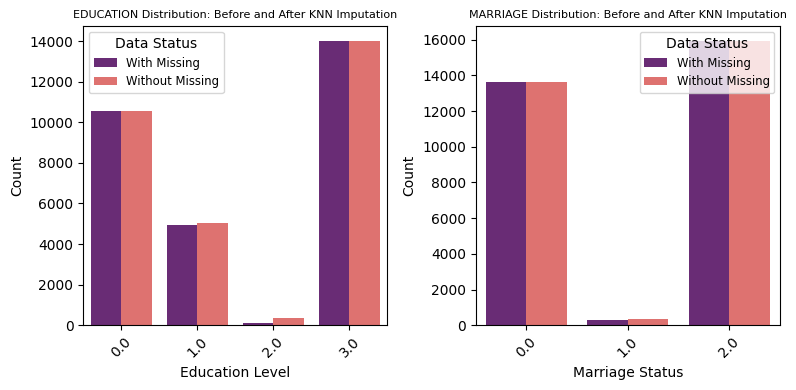

In [79]:
#compare distributions
data['NaN'] = 'With Missing'
data_imputed['NaN'] = 'Without Missing'
combined_data = pd.concat([data, data_imputed], ignore_index=True)

fig, axs = plt.subplots(1, 2, figsize=(8, 4))

sns.countplot(x='EDUCATION_label', hue='NaN', data=combined_data, palette='magma', ax=axs[0])
axs[0].set_title('EDUCATION Distribution: Before and After KNN Imputation', fontsize=8)
axs[0].set_xlabel('Education Level')
axs[0].set_ylabel('Count')
axs[0].tick_params(axis='x', rotation=45)
axs[0].legend(title='Data Status', fontsize='small')

sns.countplot(x='MARRIAGE_label', hue='NaN', data=combined_data, palette='magma', ax=axs[1])
axs[1].set_title('MARRIAGE Distribution: Before and After KNN Imputation', fontsize=8)
axs[1].set_xlabel('Marriage Status')
axs[1].set_ylabel('Count')
axs[1].tick_params(axis='x', rotation=45)
axs[1].legend(title='Data Status', fontsize='small')

plt.tight_layout()
plt.show()

data_imputed.drop('NaN', axis=1, inplace=True)

Distribution remains identical so no significant loss after KNN imputation.

In [80]:
data = data_imputed.copy() #moving forward with imputed data so more values to work with
#fix data types
cols = ['LIMIT_BAL', 'AGE', 'PAY_1', 'PAY_2', 'PAY_3', 'PAY_4', 'PAY_5',
       'PAY_6', 'BILL_AMT1', 'BILL_AMT2', 'BILL_AMT3', 'BILL_AMT4',
       'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1', 'PAY_AMT2', 'PAY_AMT3',
       'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6', 'SEX_label', 'EDUCATION_label',
       'MARRIAGE_label', 'Default_label']
data[cols] = data[cols].astype('int64')

In [81]:
### Encoding

#remove bias by binary encoding
#binary Encoding can be more efficient than one-hot encoding since it generates fewer features and our data is already of high dimension and has many categories
def custom_binary_encode(value): #remove bias of labels
    return format(value, '02b')
data['SEX_binary'] = data['SEX_label'].apply(custom_binary_encode)
data['EDUCATION_binary'] = data['EDUCATION_label'].apply(custom_binary_encode)
data['MARRIAGE_binary'] = data['MARRIAGE_label'].apply(custom_binary_encode)
data['Default_binary'] = data['Default_label'].apply(custom_binary_encode)

#drop repetitive columns
data.drop(['MARRIAGE_label', 'EDUCATION_label', 'SEX_label', 'Default_label'], axis=1, inplace=True)

In [82]:
### Outlier Detection

#check outliers in dataset using Z-Score
from scipy import stats
numerical_cols = data.select_dtypes(include=['int64']).columns
z = np.abs(stats.zscore(data[numerical_cols]))
print(z)                            
threshold = 3
outliers = np.where(z > threshold)
count = np.count_nonzero(z > threshold)
count

       LIMIT_BAL       AGE     PAY_1     PAY_2     PAY_3     PAY_4     PAY_5  \
0       1.136285  1.246078  1.795105  1.782037  0.698752  0.668642  1.532847   
1       0.365619  1.029141  0.875185  1.782037  0.137468  0.187408  0.233623   
2       0.596819  0.161397  0.014912  0.110218  0.137468  0.187408  0.233623   
3       0.905085  0.164007  0.014912  0.110218  0.137468  0.187408  0.233623   
4       0.905085  2.333368  0.875185  0.110218  0.698752  0.187408  0.233623   
...          ...       ...       ...       ...       ...       ...       ...   
29960   0.405046  0.380943  0.014912  0.110218  0.137468  0.187408  0.233623   
29961   0.134420  0.814815  0.875185  0.725692  0.698752  0.668642  0.233623   
29962   1.059218  0.164007  3.575299  2.617946  1.809908  0.668642  0.233623   
29963   0.673885  0.597879  0.905009  0.725692  0.137468  0.187408  0.233623   
29964   0.905085  1.140219  0.014912  0.110218  0.137468  0.187408  0.233623   

          PAY_6  BILL_AMT1  BILL_AMT2  

7476

7476 rows are classified as outliers. Since huge chunk of data, will not remove.

In [83]:
### Scaling

#Scale LIMIT_BAL, BILL_AMT1-6, PAY_AMT1-6 data since extreme ranges
#Robust scaling (uses median and IQR) so robust to outliers
cols = ['LIMIT_BAL','BILL_AMT1','BILL_AMT2', 'BILL_AMT3', 'BILL_AMT4',
       'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1', 'PAY_AMT2', 'PAY_AMT3',
       'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6',]
scaler = RobustScaler(copy=True)
data_scaled = scaler.fit_transform(data[cols])
data_scaled = pd.DataFrame(data_scaled, columns=cols)
data_scaled = pd.concat([data_scaled, data.drop(columns=cols)], axis=1)

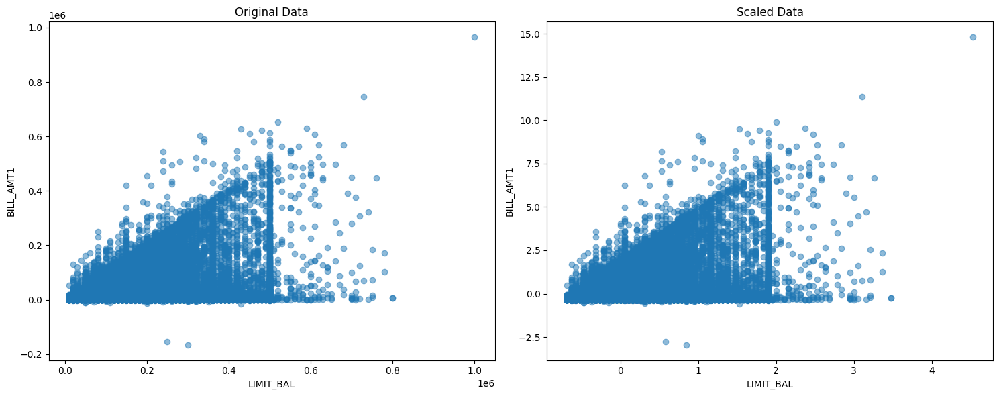

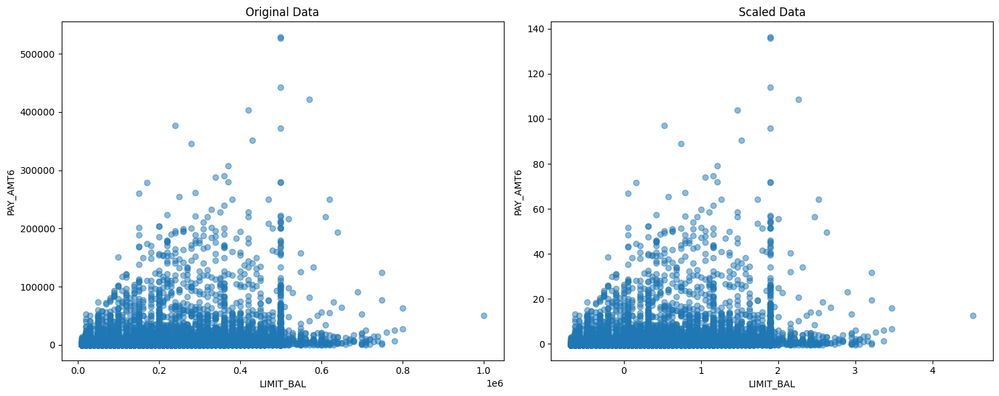

In [84]:
#compare distribution of scaled data
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
## create scatter plot using features 1 and 2 of original data
ax1.scatter(data['LIMIT_BAL'], data['BILL_AMT1'], alpha=0.5)
ax1.set_title('Original Data')
ax1.set_xlabel('LIMIT_BAL')
ax1.set_ylabel('BILL_AMT1')

## create scatter plot using features 1 and 2 of scaled data
ax2.scatter(data_scaled['LIMIT_BAL'], data_scaled['BILL_AMT1'], alpha=0.5)
ax2.set_title('Scaled Data')
ax2.set_xlabel('LIMIT_BAL')
ax2.set_ylabel('BILL_AMT1')

plt.tight_layout()

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
## create scatter plot using features 1 and 2 of original data
ax1.scatter(data['LIMIT_BAL'], data['PAY_AMT6'], alpha=0.5)
ax1.set_title('Original Data')
ax1.set_xlabel('LIMIT_BAL')
ax1.set_ylabel('PAY_AMT6')

## create scatter plot using features 1 and 2 of scaled data
ax2.scatter(data_scaled['LIMIT_BAL'], data_scaled['PAY_AMT6'], alpha=0.5)
ax2.set_title('Scaled Data')
ax2.set_xlabel('LIMIT_BAL')
ax2.set_ylabel('PAY_AMT6')

plt.tight_layout()

Data follows identical distribution after scaling.

In [85]:
#combine datasets
#since credit data is for Apr-Sep 2005, remove additional rows from macro dataset
data_macro = data_macro[data_macro['Month'].isin(['Apr','May','Jun','Jul','Aug','Sep'])]

#add count of defaults in macro data
data_macro['defaults'] = 0
cols = ['PAY_1', 'PAY_2', 'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6']
rows = [8, 7, 6, 5, 4, 3]
for col, row_index in zip(cols, rows):
    count = (data[col].isin([1, 2, 3, 4, 5, 6, 7, 8, 9])).sum()
    data_macro.loc[row_index, 'defaults'] = count
data_macro

,Month,CPI,Unemployment Rate,defaults
3,Apr,83.93,4.04,3078
4,May,84.39,4.10,2967
5,Jun,84.66,4.22,3509
6,Jul,85.65,4.32,4212
7,Aug,86.28,4.36,4437
8,Sep,86.41,4.14,6796


In [86]:
#add count of defaults in income level data
#clean data
rows = data_income.loc[[0, 1, 3], 'Avg Income level']
avg = rows.mean()
data_income.loc[13, 'Demographic'] = 'others'
data_income.loc[13, 'Avg Income level'] = avg
data_income = data_income.drop([0, 1, 3])
data_income.loc[4, 'Demographic'] = 'University'
data_income.loc[5, 'Demographic'] = 'Graduate school'

In [87]:
#add count of defaults
data_income['defaults'] = 0
count = ((data['EDUCATION_binary'] == '01') & (data['Default_binary'] == '01')).sum()
data_income.loc[2, 'defaults'] = count
count = ((data['EDUCATION_binary'] == '11') & (data['Default_binary'] == '01')).sum()
data_income.loc[4, 'defaults'] = count
count = ((data['EDUCATION_binary'] == '00') & (data['Default_binary'] == '01')).sum()
data_income.loc[5, 'defaults'] = count
count = ((data['EDUCATION_binary'] == '10') & (data['Default_binary'] == '01')).sum()
data_income.loc[13, 'defaults'] = count
count = ((data['SEX_binary'] == '01') & (data['Default_binary'] == '01')).sum()
data_income.loc[6, 'defaults'] = count
count = ((data['SEX_binary'] == '00') & (data['Default_binary'] == '01')).sum()
data_income.loc[7, 'defaults'] = count
count = ((data['AGE'] < 30) & (data['Default_binary'] == '01')).sum()
data_income.loc[8, 'defaults'] = count
count = ((data['AGE'] > 29) & (data['AGE'] < 35) & (data['Default_binary'] == '01')).sum()
data_income.loc[9, 'defaults'] = count
count = ((data['AGE'] > 34) & (data['AGE'] < 40) & (data['Default_binary'] == '01')).sum()
data_income.loc[10, 'defaults'] = count
count = ((data['AGE'] > 39) & (data['AGE'] < 45) & (data['Default_binary'] == '01')).sum()
data_income.loc[11, 'defaults'] = count
count = ((data['AGE'] > 44) & (data['AGE'] < 55) & (data['Default_binary'] == '01')).sum()
data_income.loc[12, 'defaults'] = count
count = ((data['AGE'] > 64) & (data['Default_binary'] == '01')).sum()
data_income.loc[14, 'defaults'] = count
data_income

,Demographic,Avg Income level,defaults
2,High school,514627.585380,1244
4,University,619845.267740,3328
5,Graduate school,715520.257040,2032
6,Male,568403.329720,2869
7,Female,424122.205020,3761
8,Under 30 yrs,376191.936450,2196
9,30-34 yrs,510716.672830,1174
10,35-39 yrs,571059.575770,1101
11,40-44 yrs,593171.352410,865
12,45-54 yrs,613474.185580,1013


#### Exploratory Data Analysis and Visualization

In [88]:
### Statistical summary
data.describe()

,LIMIT_BAL,AGE,PAY_1,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6
count,29965.000000,29965.000000,29965.000000,29965.000000,29965.000000,29965.000000,29965.000000,29965.000000,29965.000000,29965.000000,2.996500e+04,29965.000000,29965.000000,29965.000000,29965.000000,2.996500e+04,29965.000000,29965.000000,29965.000000,29965.000000
mean,167442.005006,35.487969,-0.016753,-0.131854,-0.164392,-0.218922,-0.264509,-0.289438,51283.009778,49236.366294,4.706792e+04,43313.329885,40358.334390,38917.012281,5670.099316,5.927983e+03,5231.688837,4831.617454,4804.897047,5221.498014
std,129760.135222,9.219459,1.123492,1.196322,1.195878,1.168175,1.132220,1.149090,73658.132403,71195.567392,6.937135e+04,64353.514373,60817.130623,59574.147742,16571.849467,2.305346e+04,17616.361124,15674.464538,15286.372298,17786.976864
min,10000.000000,21.000000,-2.000000,-2.000000,-2.000000,-2.000000,-2.000000,-2.000000,-165580.000000,-69777.000000,-1.572640e+05,-170000.000000,-81334.000000,-339603.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000
25%,50000.000000,28.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,3595.000000,3010.000000,2.711000e+03,2360.000000,1787.000000,1262.000000,1000.000000,8.500000e+02,390.000000,300.000000,261.000000,131.000000
50%,140000.000000,34.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,22438.000000,21295.000000,2.013500e+04,19081.000000,18130.000000,17124.000000,2102.000000,2.010000e+03,1804.000000,1500.000000,1500.000000,1500.000000
75%,240000.000000,41.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,67260.000000,64109.000000,6.020100e+04,54601.000000,50247.000000,49252.000000,5008.000000,5.000000e+03,4512.000000,4016.000000,4042.000000,4000.000000
max,1000000.000000,79.000000,8.000000,8.000000,8.000000,8.000000,8.000000,8.000000,964511.000000,983931.000000,1.664089e+06,891586.000000,927171.000000,961664.000000,873552.000000,1.684259e+06,896040.000000,621000.000000,426529.000000,528666.000000


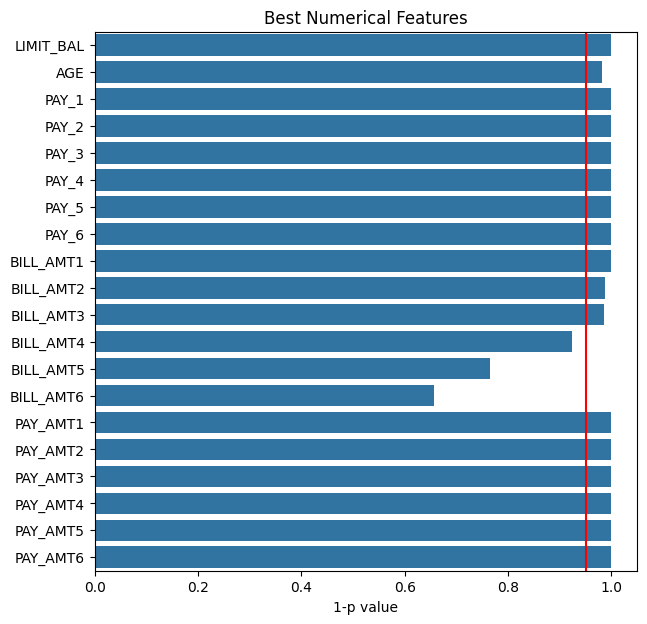

In [89]:
numerical = ['LIMIT_BAL','AGE','PAY_1','PAY_2','PAY_3','PAY_4','PAY_5','PAY_6','BILL_AMT1','BILL_AMT2','BILL_AMT3',
             'BILL_AMT4','BILL_AMT5','BILL_AMT6','PAY_AMT1','PAY_AMT2','PAY_AMT3','PAY_AMT4','PAY_AMT5','PAY_AMT6']
categorical = ['SEX_binary','EDUCATION_binary','MARRIAGE_binary']

#T Test for numerical columns
p=[]
from scipy.stats import ttest_ind
for i in numerical:
    df1=data.groupby('Default_binary').get_group('00')
    df2=data.groupby('Default_binary').get_group('01')
    t,pvalue=ttest_ind(df1[i],df2[i])
    p.append(1-pvalue)
plt.figure(figsize=(7,7))
sns.barplot(x=p, y=numerical)
plt.title('Best Numerical Features')
plt.axvline(x=(1-0.05),color='r')
plt.xlabel('1-p value')
plt.show()

All features show importance, and almost all of them show statistical significance so won't drop any.

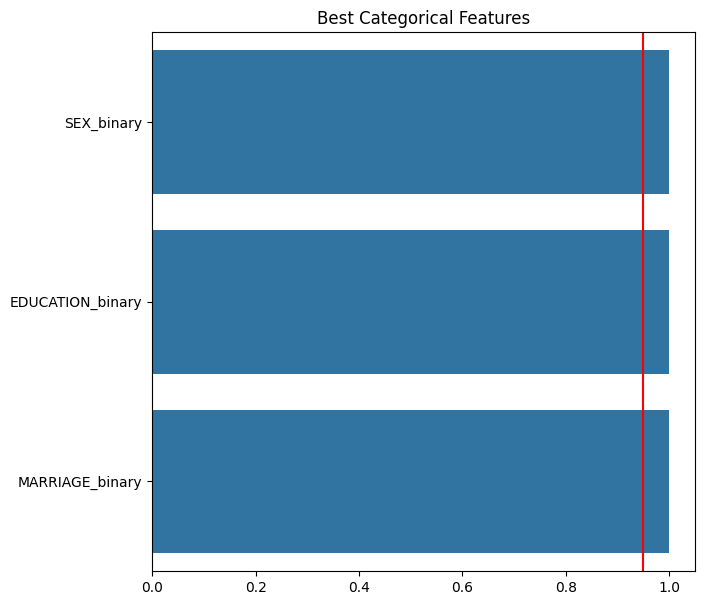

In [90]:
#Chi Square test for Categorical Columns
from scipy.stats import chi2_contingency
l=[]
for i in categorical:
    pvalue  = chi2_contingency(pd.crosstab(data['Default_binary'],data[i]))[1]
    l.append(1-pvalue)
plt.figure(figsize=(7,7))
sns.barplot(x=l, y=categorical)
plt.title('Best Categorical Features')
plt.axvline(x=(1-0.05),color='r')
plt.show()

All categorical features show statistical significance so won't drop any.

In [91]:
### Visualisations

all = ['LIMIT_BAL','AGE','PAY_1','PAY_2','PAY_3','PAY_4','PAY_5','PAY_6','BILL_AMT1','BILL_AMT2','BILL_AMT3',
       'BILL_AMT4','BILL_AMT5','BILL_AMT6','PAY_AMT1','PAY_AMT2','PAY_AMT3','PAY_AMT4','PAY_AMT5','PAY_AMT6','SEX_binary',
       'EDUCATION_binary','MARRIAGE_binary','Default_binary']

#correlation heatmap for all variables
corr = data[all].corr()
fig1 = go.Figure(data=go.Heatmap(z=corr.values,
                  x=corr.index.values,
                  y=corr.columns.values,
                  showscale=True,
                  colorscale='Plasma',
                  colorbar=dict(
                  len=1.0,        
                  thickness=10,
                  xanchor='left'
                  )))
fig1.update_layout(title_text="Interactive Correlation Heatmap", title_font_size=15, height=600, width=1000)
fig1.show()

fig1_json = fig1.to_json()
with open("correlation_heatmap.json", "w") as f:
    f.write(fig1_json)

<Figure size 800x500 with 0 Axes>

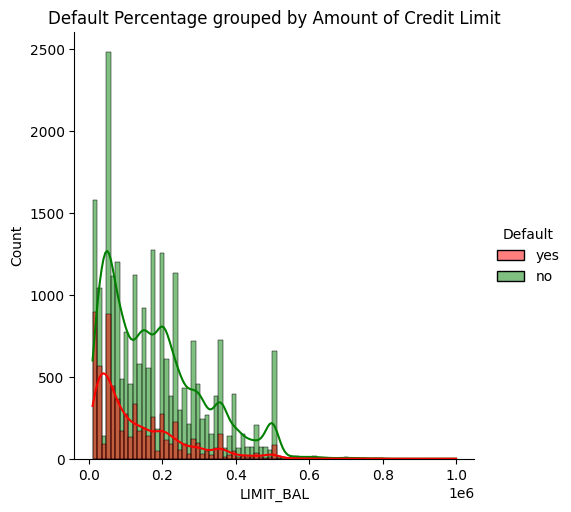

In [92]:
#density plot for LIMIT_BAL
plt.figure(figsize=(8, 5))
fig2 = sns.displot(data, x="LIMIT_BAL", fill=True, kde=True, hue="Default", palette={'no': 'green', 'yes': 'red'})
plt.title("Default Percentage grouped by Amount of Credit Limit")
plt.show()

fig2.savefig("density_plot.png")

This shows that higher the credit limit, lower is the chance of default. This is sensible as richer people tend to have higher credit limit and are so less likely to default on loans. The highest defaulters are for credit limit 0 to 100,000, with the highest being for credit limit 50,000, and the density for this interval is larger for defaulters than for non-defaulters.

<IPython.core.display.Javascript object>

'<!DOCTYPE html>\n\n<html>\n<head>\n<meta content="text/html;charset=utf-8" http-equiv="Content-Type"/>\n<title>HiPlot</title>\n<link href="" rel="icon"/>\n</head>\n<body style="margin:0px">\n<div id="hiplot_4c74c8dda80a4affaeb62d499c98f60d" style="background-color: white"><div style="text-align: center">Loading HiPlot...</div>\n<noscript>\n        HiPlot needs JavaScript to run\n      </noscript>\n</div>\n<script type="text/javascript">/*! For license information please see hiplot.bundle.js.LICENSE.txt */\nvar hiplot;(function(){var __webpack_modules__={1936:function(t,e,n){"use strict";var r=n(3601),i=n.n(r),o=n(3495),a=n.n(o)()(i());a.push([t.id,".hip_thm--dark{/*!\\n * Bootstrap v4.6.0 (https://getbootstrap.com/)\\n * Copyright 2011-2021 The Bootstrap Authors\\n * Copyright 2011-2021 Twitter, Inc.\\n * Licensed under MIT (https://github.com/twbs/bootstrap/blob/main/LICENSE)\\n */@import\\"https://fonts.googleapis.com/css?family=Lato:400,700,400italic&display=swap\\"}.hip_thm--dark 
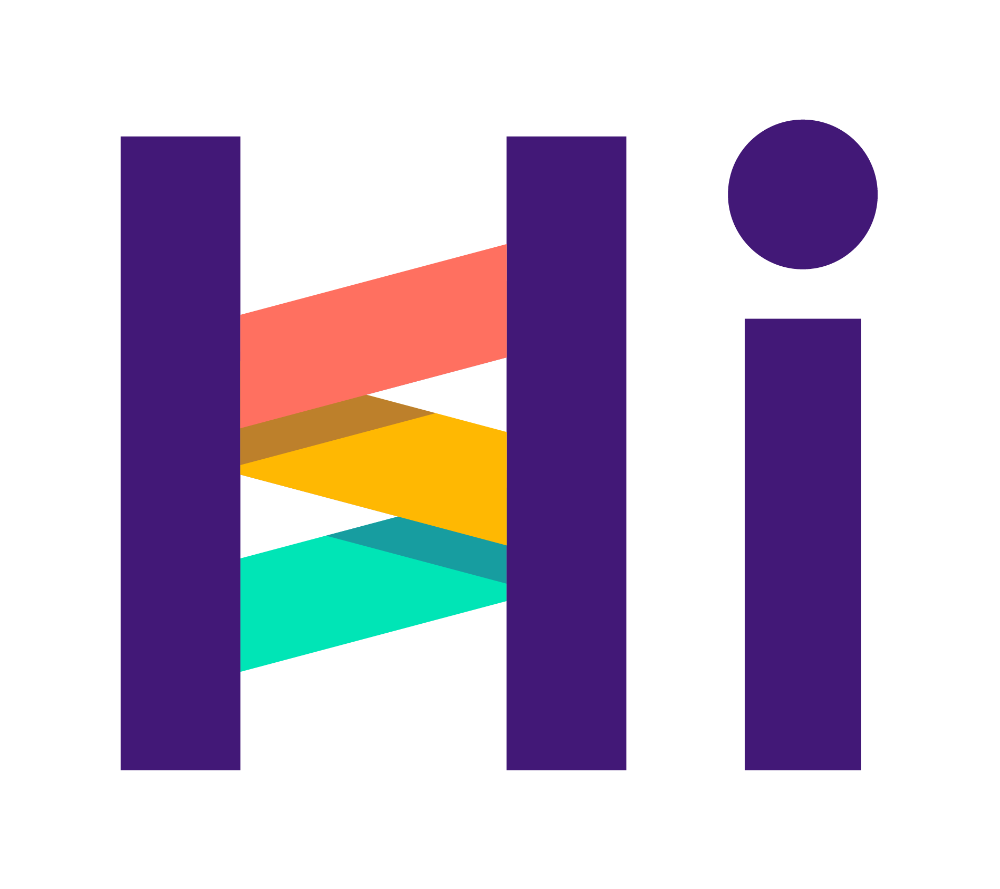

In [93]:
#hiplot for defaults on previous payments
col = ['PAY_1','PAY_2','PAY_3','PAY_4','PAY_5','PAY_6']
fig = hip.Experiment.from_dataframe(data[col]).display()
fig3 = hip.Experiment.from_dataframe(data[col])

fig3.to_html('hiplot.html')

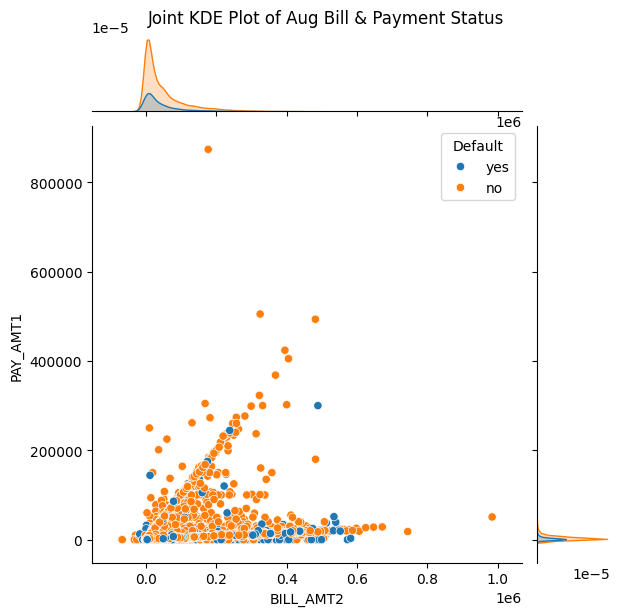

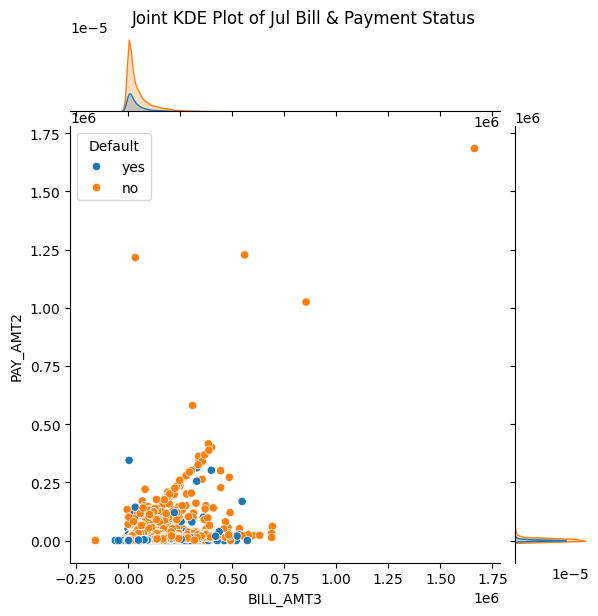

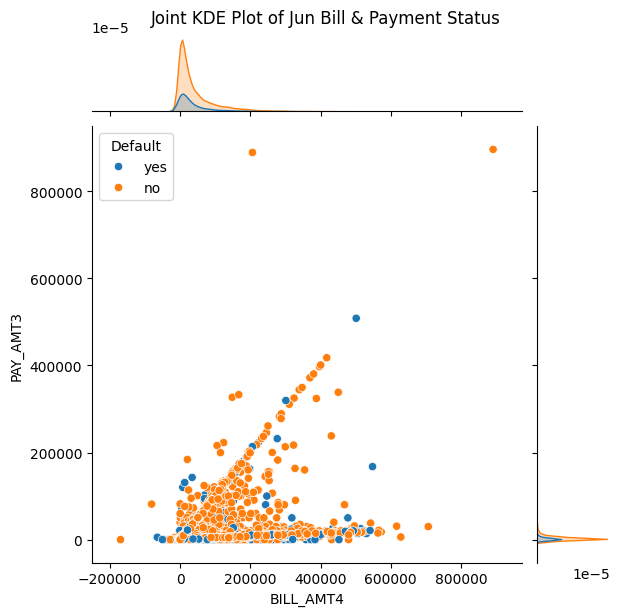

In [94]:
#bill & pay amount distributions for last 3 months (joint kde plot)
col = ['BILL_AMT1','BILL_AMT2','BILL_AMT3','BILL_AMT4','BILL_AMT5','BILL_AMT6','PAY_AMT1','PAY_AMT2','PAY_AMT3','PAY_AMT4','PAY_AMT5','PAY_AMT6','Default']

sns.jointplot(data=data[col], x="BILL_AMT2", y="PAY_AMT1", kind="scatter", hue='Default')
plt.suptitle("Joint KDE Plot of Aug Bill & Payment Status", y=1.02)

sns.jointplot(data=data[col], x="BILL_AMT3", y="PAY_AMT2", kind="scatter", hue='Default')
plt.suptitle("Joint KDE Plot of Jul Bill & Payment Status", y=1.02)

sns.jointplot(data=data[col], x="BILL_AMT4", y="PAY_AMT3", kind="scatter", hue='Default')
plt.suptitle("Joint KDE Plot of Jun Bill & Payment Status", y=1.02)

plt.show()

In [95]:
#PCA Scatterplot for PAY_AMT1-6 and BILL_AMT1-6 (bcz high dimensionality)
X = data[['BILL_AMT1','BILL_AMT2','BILL_AMT3','BILL_AMT4','BILL_AMT5','BILL_AMT6','PAY_AMT1','PAY_AMT2','PAY_AMT3','PAY_AMT4','PAY_AMT5','PAY_AMT6','Default_binary']]
pca = PCA(n_components=2)
components = pca.fit_transform(X)
fig = px.scatter(components, x=0, y=1, color=data['Default_binary'],color_discrete_sequence=px.colors.qualitative.Plotly)
fig.update_xaxes(title_text="0", row=2, col=1)
fig.update_yaxes(title_text="1", row=2, col=1)
fig.show()

pca_plot = fig.to_json()
with open("pca_plot.json", "w") as f:
    f.write(pca_plot)

There is significant overlap between the Default_binary classes (e.g., no clear separation between defaulted and non-defaulted groups). This might imply that the first two PCA components do not strongly distinguish between those who defaulted and those who did not. This could be a sign that the features (bill and payment amounts) alone do not provide a strong signal for predicting default risk, at least in the two-dimensional space captured by PCA.

In [96]:
#bar charts for demographic data
filtered_data = filtered_data = data_income[data_income['Demographic'].isin(['Male', 'Female'])]
fig7 = px.bar(filtered_data, x='Demographic', y='defaults',
             hover_data=['defaults', 'Avg Income level'], color='Avg Income level',
             labels={'defaults':'Defaults'}, height=400,color_continuous_scale=px.colors.sequential.Viridis)
fig7.update_layout(title_text="SEX: Income Level vs Defaults", title_font_size=15, height=400, width=500, xaxis_title='')
fig7.show()
sex = fig7.to_json()
with open("sex_plot.json", "w") as f:
    f.write(sex)

filtered_data = filtered_data = data_income[data_income['Demographic'].isin(['High school', 'University', 'Graduate school', 'others'])]
fig8 = px.bar(filtered_data, x='Demographic', y='defaults',
             hover_data=['defaults', 'Avg Income level'], color='Avg Income level',
             labels={'defaults':'Defaults'}, height=400,color_continuous_scale=px.colors.sequential.Viridis)
fig8.update_layout(title_text="EDUCATION: Income Level vs Defaults", title_font_size=15, height=400, width=500, xaxis_title='')
fig8.show()
education = fig8.to_json()
with open("education_plot.json", "w") as f:
    f.write(education)

filtered_data = filtered_data = data_income[data_income['Demographic'].isin(['Under 30 yrs','30-34 yrs','35-39 yrs','40-44 yrs','45-54 yrs','65 yrs and above'])]
fig9 = px.bar(filtered_data, x='Demographic',  y='defaults',
             hover_data=['defaults', 'Avg Income level'], color='Avg Income level',
             labels={'defaults':'Defaults'}, height=400,color_continuous_scale=px.colors.sequential.Viridis)
fig9.update_layout(title_text="AGE: Income Level vs Defaults", title_font_size=15, height=400, width=500, xaxis_title='')
fig9.show()
age = fig9.to_json()
with open("age_plot.json", "w") as f:
    f.write(age)

grouped_data = data.groupby(['MARRIAGE', 'Default']).size().reset_index(name='Count')
fig10 = px.bar(grouped_data, x='MARRIAGE', y='Count', color='Default', barmode='group', labels={'MARRIAGE': 'MARRIAGE', 'Count': 'Count'}, 
               height=400,hover_data=['Count'],color_discrete_sequence=px.colors.qualitative.Set2)
fig10.update_layout(title_text="Relationship Status vs Defaults",title_font_size=15,height=400,width=600,xaxis_title='')
fig10.show()
marriage = fig10.to_json()
with open("marriage_plot.json", "w") as f:
    f.write(marriage)

Female population is in majority and is more likely to default on the loan. This could be explained by their high percentage in the dataset.

University education level in highest in the dataset, and is most likely to default. This could be explained by their high percentage in the dataset. Next are Graduates, and then Highschools. This should be the opposite, but again could be explained by the difference in their numbers in the dataset. Though, those least likely to default are unknown labels (others). Logically speaking, they need to be above graduate level atleast as education level and likeliness of default has an inverse relationship.

Single people are highest in number and are most likely to default. This makes sense. Type 'other' may be people in a relationship.

Young people are more likely to default than the older population.

In [97]:
#line chart for macro data
fig5 = make_subplots(specs=[[{"secondary_y": True}]])
fig5.add_trace(
    go.Scatter(x=data_macro["Month"], y=data_macro["Unemployment Rate"], mode='lines', name='Unemployment Rate',line=dict(color='green')),
    secondary_y=False
)
fig5.add_trace(
    go.Scatter(x=data_macro["Month"], y=data_macro["defaults"], mode='lines', name='Defaults',line=dict(color='orange')),
    secondary_y=True
)
fig5.update_layout(
    title='Unemployment Rate vs Defaults',
    xaxis_title='Month',
    yaxis_title='Unemployment Rate',
    yaxis2_title='Defaults',
    legend=dict(x=1.05, y=1, traceorder='normal', orientation='v'),
    showlegend=True,
    yaxis2=dict(showgrid=False),
)
fig5.show()

In [98]:
#line chart for macro data
fig6 = make_subplots(specs=[[{"secondary_y": True}]])
fig6.add_trace(
    go.Scatter(x=data_macro["Month"], y=data_macro["CPI"], mode='lines', name='Inflation Rate',line=dict(color='green')),
    secondary_y=False
)
fig6.add_trace(
    go.Scatter(x=data_macro["Month"], y=data_macro["defaults"], mode='lines', name='Defaults',line=dict(color='orange')),
    secondary_y=True
)
fig6.update_layout(
    title='Inflation Rate vs Defaults',
    xaxis_title='Month',
    yaxis_title='Inflation Rate',
    yaxis2_title='Defaults',
    legend=dict(x=1.05, y=1, traceorder='normal', orientation='v'),
    showlegend=True,
    yaxis2=dict(showgrid=False)  
)
fig6.show()

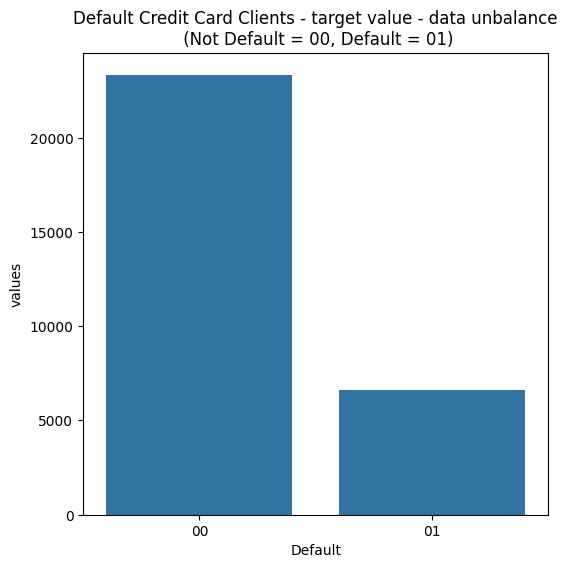

In [99]:
### Class Imbalance

#check imbalance
temp = data["Default_binary"].value_counts()
df = pd.DataFrame({'Default': temp.index,'values': temp.values})
plt.figure(figsize = (6,6))
plt.title('Default Credit Card Clients - target value - data unbalance\n (Not Default = 00, Default = 01)')
sns.set_color_codes("pastel")
sns.barplot(x = 'Default', y="values", data=df)
locs, labels = plt.xticks()
plt.show()

Majority class (not default) has 77% samples. Minority class (default) has 22% samples. Data is highly imbalanced. The best method here would be to undersample majority class using one-class classification. As we have not learnt it yet, we will apply SMOTE for demonstration purposes.

In [100]:
# separate features (X) and target (y)
X = data.drop(['Default', 'Default_binary','MARRIAGE','SEX','EDUCATION'], axis=1)
y = data['Default_binary']

# display original class distribution
print("\nOriginal class distribution:")
print(y.value_counts())

# apply SMOTE
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X, y)

# display new class distribution
print("\nClass distribution after SMOTE:")
print(pd.Series(y_resampled).value_counts())


Original class distribution:
Default_binary
00    23335
01     6630
Name: count, dtype: int64

Class distribution after SMOTE:
Default_binary
01    23335
00    23335
Name: count, dtype: int64


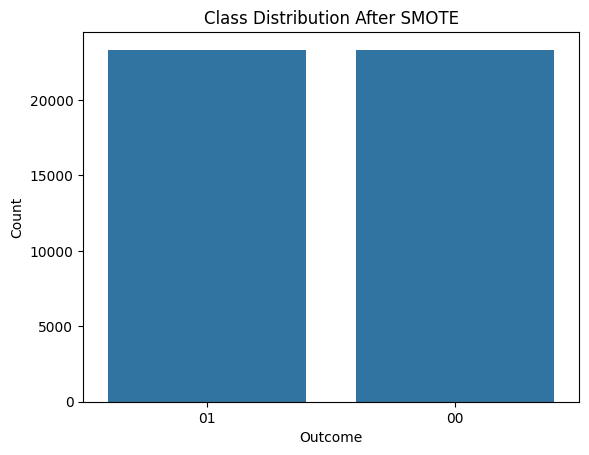

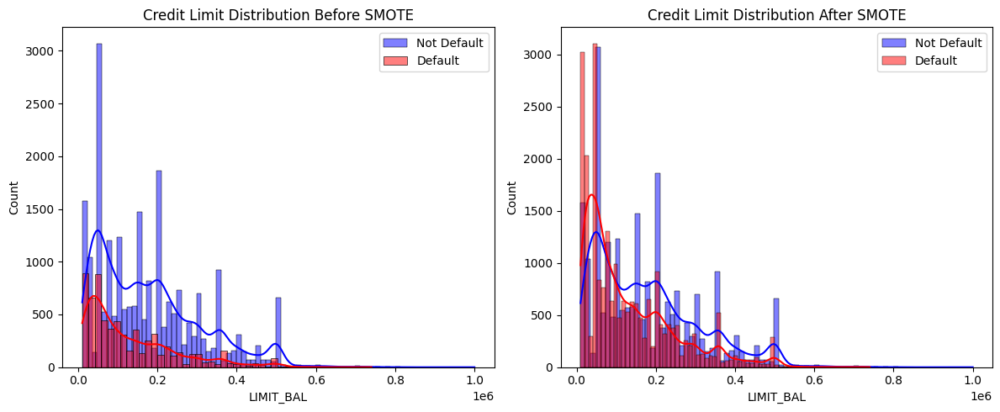

In [101]:
# Bar chart for class distribution after SMOTE
sns.countplot(x=y_resampled)
plt.title('Class Distribution After SMOTE')
plt.xlabel('Outcome')
plt.ylabel('Count')
plt.show()

#check distribution for one variable
plt.figure(figsize=(12,5))

resampled_data = pd.DataFrame(X_resampled, columns=X.columns)
resampled_data['Default_binary'] = y_resampled

plt.subplot(1,2,1)
sns.histplot(data[data['Default_binary']=='00']['LIMIT_BAL'], color='blue', label='Not Default', kde=True) 
sns.histplot(data[data['Default_binary']=='01']['LIMIT_BAL'], color='red', label='Default', kde=True) 
plt.title('Credit Limit Distribution Before SMOTE')
plt.legend()

plt.subplot(1,2,2)
sns.histplot(resampled_data[resampled_data['Default_binary']=='00']['LIMIT_BAL'], color='blue', label='Not Default', kde=True)
sns.histplot(resampled_data[resampled_data['Default_binary']=='01']['LIMIT_BAL'], color='red', label='Default', kde=True)
plt.title('Credit Limit Distribution After SMOTE')
plt.legend()

plt.tight_layout()
plt.show()

SMOTE made an impact on the shape of the histograms since the smoothed-out line now follows an exaggerated pattern for default class, i.e. the mean, median and mode have changed. There is increase in count for some values of LIMIT_BAL, but not relative to the proportion of the difference in the count for each rectangle, which has raised the height of the histograms. So the values now occur more frequently than before.